# Hard disk failure prediction using survival analysis + EDA

In [2]:
import numpy as np 
import pandas as pd 
from pandas.plotting import table 

from scipy.stats import pearsonr, spearmanr, kendalltau


import datetime

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns

from lifelines.utils import datetimes_to_durations
from lifelines.utils import survival_table_from_events

from lifelines import (KaplanMeierFitter, CoxPHFitter, WeibullFitter, ExponentialFitter, LogNormalFitter, LogLogisticFitter, NelsonAalenFitter, PiecewiseExponentialFitter, GeneralizedGammaFitter, SplineFitter)
from lifelines.plotting import add_at_risk_counts, rmst_plot
from lifelines.utils import median_survival_times

from numpy import mean
from numpy import std


import warnings
warnings.filterwarnings('ignore')

In [3]:
def corrfunc(x,y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    P, Pp = pearsonr(x, y)
    S, Sp = spearmanr(x, y)
    K, Kp = kendalltau(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'Pearson = {P:.2f}, {Pp:.3f}', xy=(.1, .9), xycoords=ax.transAxes)
    ax.annotate(f'Spearman = {S:.2f}, {Sp:.3f}', xy=(.1, .8), xycoords=ax.transAxes)
    ax.annotate(f'Kendall = {K:.2f}, {Kp:.3f}', xy=(.1, .7), xycoords=ax.transAxes)

### Data load and explore

In [4]:
#data source: https://www.kaggle.com/backblaze/hard-drive-test-data
hDData = pd.read_csv('/Users/bala/Documents/EdgeAnalytics/harddrive.csv')

In [5]:
hDData['date'] = pd.to_datetime(hDData['date'])
#hDData['date']=hDData['date'].dt.date
print(hDData['date'].max())
print(hDData['date'].min())

2016-04-29 00:00:00
2016-01-01 00:00:00


In [6]:
hDData.shape

(3179295, 95)

In [7]:
hDData.head()

,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,smart_3_normalized,...,smart_250_normalized,smart_250_raw,smart_251_normalized,smart_251_raw,smart_252_normalized,smart_252_raw,smart_254_normalized,smart_254_raw,smart_255_normalized,smart_255_raw
0,2016-01-01,MJ0351YNG9Z0XA,Hitachi HDS5C3030ALA630,1.482490e-311,0,100,0,135.0,108.0,143,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-01,Z305B2QN,ST4000DM000,1.976651e-311,0,113,54551400,NaN,NaN,96,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-01,MJ0351YNG9Z7LA,Hitachi HDS5C3030ALA630,1.482490e-311,0,100,0,136.0,104.0,124,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-01,MJ0351YNGABYAA,Hitachi HDS5C3030ALA630,1.482490e-311,0,100,0,136.0,104.0,137,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-01,WD-WMC4N2899475,WDC WD30EFRX,1.482490e-311,0,200,0,NaN,NaN,175,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
#extracting models with failures for analysis
hDDataModelValCounts = hDData.model.value_counts()
hDDataModelValCounts = pd.DataFrame(hDDataModelValCounts).reset_index()
hDDataModelValCounts.columns = ['model', 'modelCount']
hDDataFailByModelCounts = hDData[hDData['failure'] == 1].groupby('model')['failure'].count()
hDDataFailByModelProp = pd.merge(hDDataModelValCounts.reset_index(), hDDataFailByModelCounts.reset_index(), on = 'model')
hDDataFailByModelProp['failPercent'] = (hDDataFailByModelProp['failure']/hDDataFailByModelProp['modelCount'])*100
hDDataFailByModelProp.sort_values('failPercent', ascending = False,inplace=True)
hDDataFailByModelProp[:10]

,index,model,modelCount,failure,failPercent
24,59,WDC WD3200BEKT,32,1,3.125000
22,40,WDC WD1600AAJB,195,2,1.025641
19,31,WDC WD800AAJS,708,6,0.847458
23,44,WDC WD800BB,138,1,0.724638
12,18,ST320LT007,2687,15,0.558243
21,39,WDC WD800AAJB,200,1,0.500000
20,32,WDC WD3200BEKX,534,1,0.187266
18,28,WDC WD10EADS,1342,2,0.149031
17,25,ST3160318AS,2299,2,0.086994
10,14,WDC WD20EFRX,6871,3,0.043662


In [9]:
hDDataFailByModelProp[hDDataFailByModelProp['model'].str.contains('Hitachi')]

,index,model,modelCount,failure,failPercent
3,3,Hitachi HDS722020ALA330,224052,13,0.005802
5,5,Hitachi HDS5C4040ALE630,136969,4,0.002920
2,2,Hitachi HDS5C3030ALA630,236690,5,0.002112


In [10]:
#number of models in dataset - using a previously computed variable
len(hDDataModelValCounts)

69

In [11]:
#devices are added and removed from the dataset, with or without failure. It's unclear why the the same 'serial_number' and 'date' appear more than once.
#in any case, the following code slices out device survival during the various intervals recorded

#https://stackoverflow.com/questions/53305411/how-to-find-gaps-in-dates-using-pandas
df = hDData
# Convert date to true dates
#df.date = pd.to_datetime(df.date, format='%Y-%m-%d')
#df['date'] = df['date'].dt.date
grp = df.groupby(by='serial_number')
# Starts of periods
st = grp.apply(lambda x: x.date[x.date - pd.DateOffset(days = 1)
    != x.date.shift()]).reset_index(level=1,drop=True)
# Ends of periods
en = grp.apply(lambda x: x.date[x.date + pd.DateOffset(days = 1)
    != x.date.shift(-1)]).reset_index(level=1,drop=True)
# Result - concat start / end dates
res = pd.concat([st, en], axis=1).reset_index()
# Set column names
res.columns = ['serial_number', 'start', 'end']
res

,serial_number,start,end
0,13H2B97AS,2016-01-01,2016-01-01
1,13H2B97AS,2016-01-01,2016-01-21
2,13H2B97AS,2016-04-01,2016-04-01
3,13H2B97AS,2016-04-01,2016-04-29
4,13H32WEAS,2016-01-01,2016-01-01
...,...,...,...
243564,Z4D2B5EC,2016-04-01,2016-04-29
243565,Z4E09K9M,2016-04-01,2016-04-01
243566,Z4E09K9M,2016-04-01,2016-04-29
243567,Z4E09KB7,2016-04-01,2016-04-01


In [12]:
#adding back the details needed for survival analysis
df1 = pd.merge(res,df[['model','serial_number','failure','date']], left_on=['serial_number','end'],right_on=['serial_number','date'], how='left').drop(['date'], axis='columns')
df1['duration'] = df1['end']-df1['start']
df1['duration'] = df1.duration.dt.days
print(df1['end'].max())
print(df1['end'].min())
df1

2016-04-29 00:00:00
2016-01-01 00:00:00


,serial_number,start,end,model,failure,duration
0,13H2B97AS,2016-01-01,2016-01-01,TOSHIBA DT01ACA300,0,0
1,13H2B97AS,2016-01-01,2016-01-01,TOSHIBA DT01ACA300,0,0
2,13H2B97AS,2016-01-01,2016-01-21,TOSHIBA DT01ACA300,0,20
3,13H2B97AS,2016-04-01,2016-04-01,TOSHIBA DT01ACA300,0,0
4,13H2B97AS,2016-04-01,2016-04-01,TOSHIBA DT01ACA300,0,0
...,...,...,...,...,...,...
364117,Z4E09K9M,2016-04-01,2016-04-01,ST4000DX002,0,0
364118,Z4E09K9M,2016-04-01,2016-04-29,ST4000DX002,0,28
364119,Z4E09KB7,2016-04-01,2016-04-01,ST4000DX002,0,0
364120,Z4E09KB7,2016-04-01,2016-04-01,ST4000DX002,0,0


In [13]:
#subset models for discusion
modelList = df1['model'][df1.model.str.contains('|'.join(['ALE630','BEKT','800BB','800AAJS','600AJB']))].unique()

In [14]:
modelList = ['Hitachi HDS5C4040ALE630', 'WDC WD800BB','WDC WD800AAJS', 'WDC WD3200BEKT']
modelList

['Hitachi HDS5C4040ALE630', 'WDC WD800BB', 'WDC WD800AAJS', 'WDC WD3200BEKT']

In [15]:
for i, model in enumerate(modelList):
    print(df1['serial_number'][df1['model']==model].sample(1))

71585    PL1311LAG3E8RH
Name: serial_number, dtype: object
198436    WD-WCAMD3184748
Name: serial_number, dtype: object
202933    WD-WMAV3J935957
Name: serial_number, dtype: object
210018    WD-WX71A9290300
Name: serial_number, dtype: object


Text(0.5, 1.0, 'Patchy event recordings')

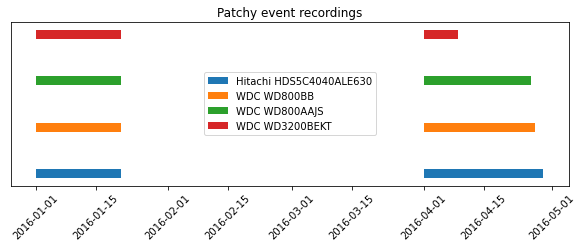

In [16]:
#colorList = ['tab:orange', 'tab:green', 'tab:red', 'tab:blue'] #note the changed colors
colorList = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
serialList = ['PL1321LAGAREUH', 'WD-WCAMD1671734', 'WD-WMAV3J875025', 'WD-WX71A9290300']
figure(figsize=(10, 3))
for i, serial in enumerate(serialList): 
    ax = plt.subplot(111)
    ax.broken_barh(list(zip(res['start'][res.serial_number == serial].values, (res['end'][res.serial_number == serial] - res['start'][res.serial_number == serial].values).values)), (i, 0.2), facecolors = colorList[i], label='%s' %modelList[i])
plt.xticks(rotation=45)
plt.yticks([])
plt.legend(loc='center')
plt.title('Patchy event recordings')

# Survival analysis

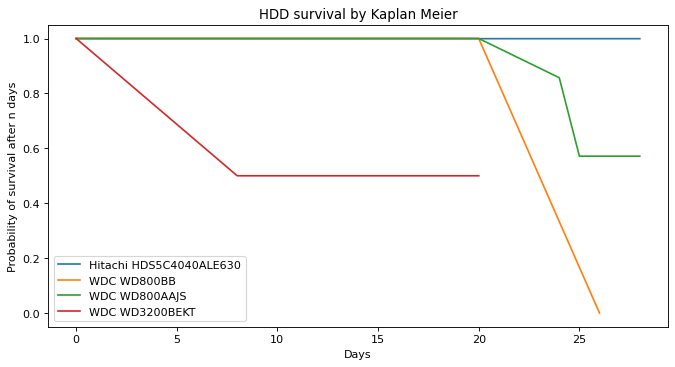

In [17]:
kmf = KaplanMeierFitter()
figure(num=None, figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')
for i, model in enumerate(modelList):    
    ax = plt.subplot(111)
    kmf.fit(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model], label=model)
    kmf.survival_function_.plot(ax=ax)
    
plt.title('HDD survival by Kaplan Meier')
plt.ylabel('Probability of survival after n days')
plt.xlabel('Days')
plt.legend()
plt.show()  

In [18]:
#these are specialized functions from the LifeLines library that show how many HDD were being tracked at each point in time 
#where, either a failure was recorded or a specific device was added or removed
kmf = KaplanMeierFitter()
print(f'These are the events,by model, by time (column "event_at"):')
print('*'*60)
for i, model in enumerate(modelList): 
    table = survival_table_from_events(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model])
    print(f'{model}:','\n',table,'\n')

These are the events,by model, by time (column "event_at"):
************************************************************
Hitachi HDS5C4040ALE630: 
           removed  observed  censored  entrance  at_risk
event_at                                                
0           10544         4     10540     15814    15814
1               1         1         0         0     5270
20           2638         1      2637         0     5269
26              1         0         1         0     2631
28           2630         0      2630         0     2630 

WDC WD800BB: 
           removed  observed  censored  entrance  at_risk
event_at                                                
0              12         0        12        18       18
20              5         0         5         0        6
26              1         1         0         0        1 

WDC WD800AAJS: 
           removed  observed  censored  entrance  at_risk
event_at                                                
0              56 

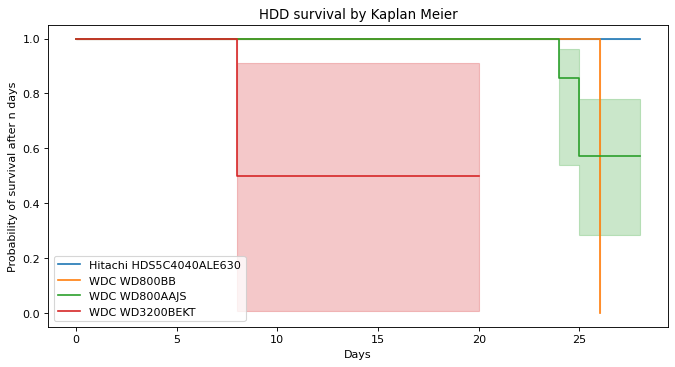

In [19]:
#many different calculated estimates can be plotted
kmf = KaplanMeierFitter()
figure(num=None, figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')
for i, model in enumerate(modelList):    
    ax = plt.subplot(111)
    kmf.fit(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model], label=model)
    kmf.plot(ax=ax)#shows the confidence intervals of the estimates
    #kmf.plot_cumulative_density()
    
plt.title('HDD survival by Kaplan Meier')
plt.ylabel('Probability of survival after n days')
plt.xlabel('Days')
plt.legend()
plt.show()  

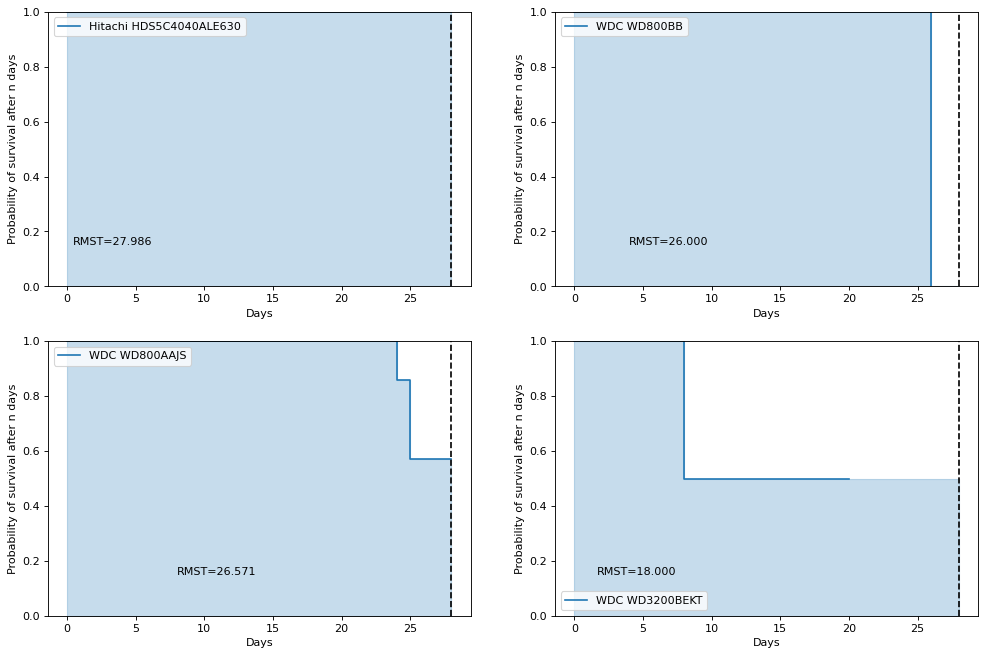

In [36]:
#this shows survival at a particular point in time, allowing comparisons
time_limit = 28
kmf = KaplanMeierFitter()
figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='k')
for i, model in enumerate(modelList):    
    ax = plt.subplot(2,2,i+1)
    kmf.fit(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model], label=model)
    #kmf.plot(ax=ax)
    #kmf.plot_cumulative_density()
    rmst_plot(kmf, t=time_limit, ax=ax)
    plt.xlabel('Days')
    plt.ylabel('Probability of survival after n days')
    
#plt.title('HDD Restricted mean survival times (RMST) by Kaplan Meier')
#plt.ylabel('Probability of survival after n days')
#plt.xlabel('Days')
# plt.legend()
# plt.show()  

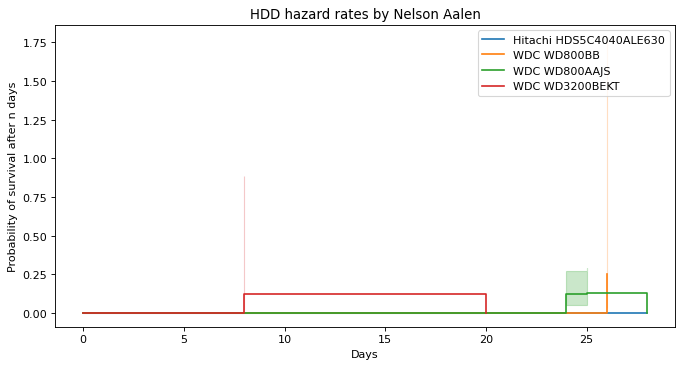

In [21]:
#note that we need the Nelson Allen algorithm to calculate hazards
bandwidth=3
naf = NelsonAalenFitter()
figure(num=None, figsize=(10, 5), dpi=80, facecolor='w', edgecolor='k')
for i, model in enumerate(modelList):    
    ax = plt.subplot(111)
    naf.fit(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model], label=model)
    #naf.plot(ax=ax)
    naf.plot_hazard(ax=ax, bandwidth=bandwidth)
    
plt.title('HDD hazard rates by Nelson Aalen')
plt.ylabel('Probability of survival after n days')
plt.xlabel('Days')
plt.legend()
plt.show()  

In [22]:
#to obtain confidence intervals along with median survivial times
kmf = KaplanMeierFitter()
lowerci = []
upperci = []
medianSurvTime = []
for i, model in enumerate(modelList):    
    kmf.fit(df1['duration'][df1['model']==model], df1['failure'][df1['model']==model], label=model)
    lowerci.append(median_survival_times(kmf.confidence_interval_).iloc[0,0])
    medianSurvTime.append(kmf.median_survival_time_)
    upperci.append(median_survival_times(kmf.confidence_interval_).iloc[0,1])
survivalPredictions = pd.DataFrame(modelList)
survivalPredictions['Lower CI'] = lowerci
survivalPredictions['Median Survivial Time, Days'] = medianSurvTime
survivalPredictions['Upper CI'] = upperci
survivalPredictions

,0,Lower CI,"Median Survivial Time, Days",Upper CI
0,Hitachi HDS5C4040ALE630,inf,inf,inf
1,WDC WD800BB,26.0,26.0,26.0
2,WDC WD800AAJS,25.0,inf,inf
3,WDC WD3200BEKT,8.0,8.0,inf


# Extracting insights from failure observations


In [23]:
medianAge = []
meanAge = []
numObs = []
numFails = []
for i, model in enumerate(modelList):    
    medianAge.append(df1['duration'][(df1['model']==model) & (df1['failure']==1)].median())
    meanAge.append(df1['duration'][(df1['model']==model) & (df1['failure']==1)].mean())
    numObs.append(len(df1['duration'][(df1['model']==model)]))
    numFails.append(len(df1['duration'][(df1['model']==model) & (df1['failure']==1)]))
modelPerformance = pd.DataFrame(modelList)
modelPerformance['# observations'] = numObs
modelPerformance['# failures'] = numFails
modelPerformance['MedianAge'] = medianAge
modelPerformance['MeanAge'] = meanAge
modelPerformance.columns = ['model', '# of observations', '# of failures', 'MedianAge, Days','MeanAge, Days']
#print(modelPerformance)
tidy = modelPerformance.melt(id_vars='model').rename(columns=str.title)
modelPerformance

,model,# of observations,# of failures,"MedianAge, Days","MeanAge, Days"
0,Hitachi HDS5C4040ALE630,15814,6,0.0,3.500000
1,WDC WD800BB,18,1,26.0,26.000000
2,WDC WD800AAJS,84,6,25.0,24.666667
3,WDC WD3200BEKT,6,1,8.0,8.000000


In [24]:
# fig, ax1 = plt.subplots(figsize=(10, 10))
# sns.barplot(x='Model', y='Value', hue='Variable', data=tidy, ax=ax1).set_yscale("log")
# ax1.set_title('Overview of data subset (y-axis in log scale)')
# sns.despine(fig)

In [25]:
df1[(df1['model']=='WDC WD800AAJS') & (df1['failure']==1)]

,serial_number,start,end,model,failure,duration
198841,WD-WCAV3E973409,2016-04-01,2016-04-25,WDC WD800AAJS,1,24
198847,WD-WCAV3E974559,2016-04-01,2016-04-25,WDC WD800AAJS,1,24
202886,WD-WMAV3J875025,2016-04-01,2016-04-26,WDC WD800AAJS,1,25
202910,WD-WMAV3J877125,2016-04-01,2016-04-26,WDC WD800AAJS,1,25
202928,WD-WMAV3J935956,2016-04-01,2016-04-26,WDC WD800AAJS,1,25
202934,WD-WMAV3J935957,2016-04-01,2016-04-26,WDC WD800AAJS,1,25


In [26]:
df1[(df1['model']=='WDC WD3200BEKT')]

,serial_number,start,end,model,failure,duration
210017,WD-WX71A9290300,2016-01-01,2016-01-01,WDC WD3200BEKT,0,0
210018,WD-WX71A9290300,2016-01-01,2016-01-01,WDC WD3200BEKT,0,0
210019,WD-WX71A9290300,2016-01-01,2016-01-21,WDC WD3200BEKT,0,20
210020,WD-WX71A9290300,2016-04-01,2016-04-01,WDC WD3200BEKT,0,0
210021,WD-WX71A9290300,2016-04-01,2016-04-01,WDC WD3200BEKT,0,0
210022,WD-WX71A9290300,2016-04-01,2016-04-09,WDC WD3200BEKT,1,8


In [27]:
#adding back the details needed for survival analysis
df2 = pd.merge(res,df, left_on=['serial_number','end'],right_on=['serial_number','date'], how='left').drop(['date'], axis='columns')
df2['duration'] = df2['end']-df2['start']
df2['duration'] = df2.duration.dt.days
print(df2['end'].max())
print(df2['end'].min())
#

2016-04-29 00:00:00
2016-01-01 00:00:00


In [28]:
#note that the raw features have fewer nulls
print(df2.shape)
print(df2[['smart_5_raw', 'smart_187_raw', 'smart_188_raw', 'smart_197_raw','smart_198_raw']].isnull().sum())
print(df2[['smart_5_normalized', 'smart_187_normalized', 'smart_188_normalized', 'smart_197_normalized','smart_198_normalized']].isnull().sum())

(364122, 97)
smart_5_raw           0
smart_187_raw    157855
smart_188_raw         0
smart_197_raw         0
smart_198_raw         0
dtype: int64
smart_5_normalized           0
smart_187_normalized    157855
smart_188_normalized    157855
smart_197_normalized         0
smart_198_normalized         0
dtype: int64


(15922, 12)
duration                    0
failure                     0
smart_5_raw                 0
smart_187_raw           15922
smart_188_raw               0
smart_197_raw               0
smart_198_raw               0
smart_5_normalized          0
smart_187_normalized    15922
smart_188_normalized    15922
smart_197_normalized        0
smart_198_normalized        0
dtype: int64
(15922, 7)
duration                    0
failure                     0
smart_5_normalized          0
smart_187_normalized    15922
smart_188_normalized    15922
smart_197_normalized        0
smart_198_normalized        0
dtype: int64
           duration       failure  smart_5_normalized  smart_187_normalized  \
count  15922.000000  15922.000000        15922.000000                   0.0   
mean       7.991019      0.000879          100.666248                   NaN   
std       11.538679      0.029641            8.214619                   NaN   
min        0.000000      0.000000           81.000000            

Text(0.5, 1.0, 'Correlation between features and to "duration"')

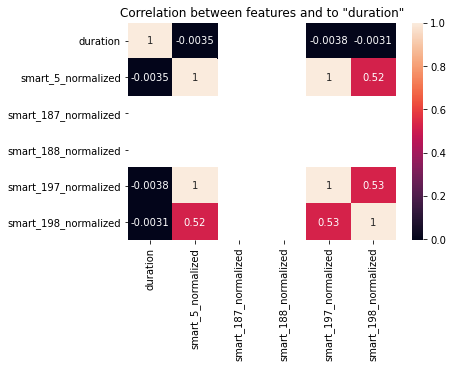

In [29]:
df2_ModelSubset = df2[df2['model'].isin(modelList)]
df2_ModelSubset = df2_ModelSubset[['duration', 'failure','smart_5_raw', 'smart_187_raw', 'smart_188_raw', 'smart_197_raw','smart_198_raw', 'smart_5_normalized', 'smart_187_normalized', 'smart_188_normalized', 'smart_197_normalized','smart_198_normalized']]
print(df2_ModelSubset.shape)
print(df2_ModelSubset.isnull().sum())
#['smart_5_raw','smart_187_raw', 'smart_188_raw', 'smart_197_raw','smart_197_normalized','smart_198_raw']
df2_ModelSubset.drop(['smart_5_raw','smart_187_raw', 'smart_188_raw', 'smart_197_raw', 'smart_198_raw'], axis='columns', inplace=True)#187 has na, 188 & 198 have low variance
print(df2_ModelSubset.shape)
print(df2_ModelSubset.isnull().sum())
print(df2_ModelSubset.describe())
sns.heatmap(df2_ModelSubset.drop('failure', axis='columns').corr(), annot=True).set_title('Correlation between features and to "duration"')

duration                    0
smart_5_normalized          0
smart_187_normalized    15814
smart_188_normalized    15814
smart_197_normalized        0
smart_198_normalized        0
dtype: int64
duration                 0
smart_5_normalized       0
smart_187_normalized    18
smart_188_normalized    18
smart_197_normalized     0
smart_198_normalized     0
dtype: int64
duration                 0
smart_5_normalized       0
smart_187_normalized    84
smart_188_normalized    84
smart_197_normalized     0
smart_198_normalized     0
dtype: int64
duration                0
smart_5_normalized      0
smart_187_normalized    6
smart_188_normalized    6
smart_197_normalized    0
smart_198_normalized    0
dtype: int64


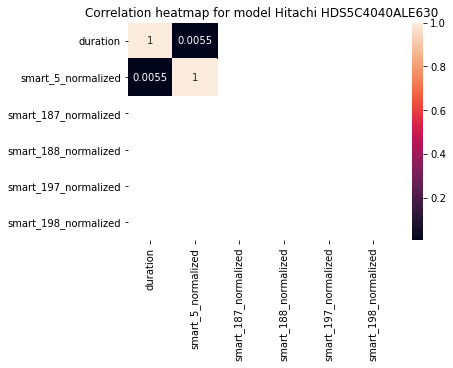

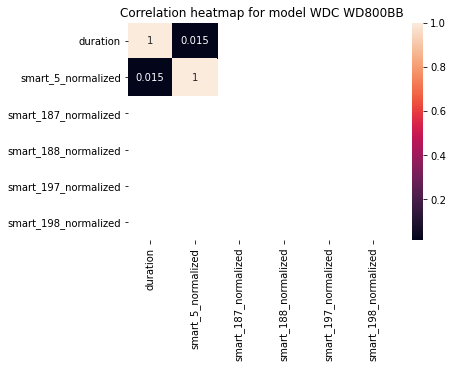

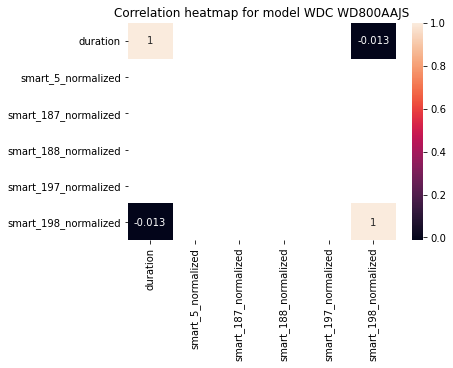

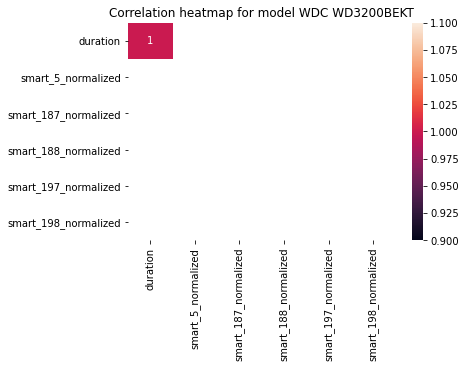

In [30]:
for i, model in enumerate(modelList):
    #ax = plt.subplot(4,4,4)
    plt.figure(i)
    df2_ModelSubset = df2[df2['model']==model]
    df2_ModelSubset = df2_ModelSubset[['duration', 'smart_5_normalized', 'smart_187_normalized', 'smart_188_normalized', 'smart_197_normalized','smart_198_normalized']]
    print(df2_ModelSubset.isnull().sum())
    sns.heatmap(df2_ModelSubset.corr(), annot=True).set_title('Correlation heatmap for model %s' %model)

In [31]:
df2_ModelSubset = df2[df2['model'].isin(modelList)]
df2_ModelSubset = df2_ModelSubset[['duration', 'failure','smart_5_raw', 'smart_187_raw', 'smart_188_raw', 'smart_197_raw','smart_198_raw', 'smart_5_normalized', 'smart_197_normalized','smart_198_normalized']]
print(df2_ModelSubset.shape)
print(df2_ModelSubset.isnull().sum())
#['smart_5_raw','smart_187_raw', 'smart_188_raw', 'smart_197_raw','smart_197_normalized','smart_198_raw']
df2_ModelSubset.drop(['smart_5_raw','smart_187_raw', 'smart_188_raw', 'smart_197_raw', 'smart_198_raw'], axis='columns', inplace=True)#187 has na, 188 & 198 have low variance
print(df2_ModelSubset.shape)
print(df2_ModelSubset.isnull().sum())
print(df2_ModelSubset.describe())

(15922, 10)
duration                    0
failure                     0
smart_5_raw                 0
smart_187_raw           15922
smart_188_raw               0
smart_197_raw               0
smart_198_raw               0
smart_5_normalized          0
smart_197_normalized        0
smart_198_normalized        0
dtype: int64
(15922, 5)
duration                0
failure                 0
smart_5_normalized      0
smart_197_normalized    0
smart_198_normalized    0
dtype: int64
           duration       failure  smart_5_normalized  smart_197_normalized  \
count  15922.000000  15922.000000        15922.000000          15922.000000   
mean       7.991019      0.000879          100.666248            100.678307   
std       11.538679      0.029641            8.214619              8.208216   
min        0.000000      0.000000           81.000000            100.000000   
25%        0.000000      0.000000          100.000000            100.000000   
50%        0.000000      0.000000          100.

In [32]:
#g = sns.pairplot(data=df2_ModelSubset, corner=True, hue = 'failure')
#g.fig.suptitle('Distribution of failures')

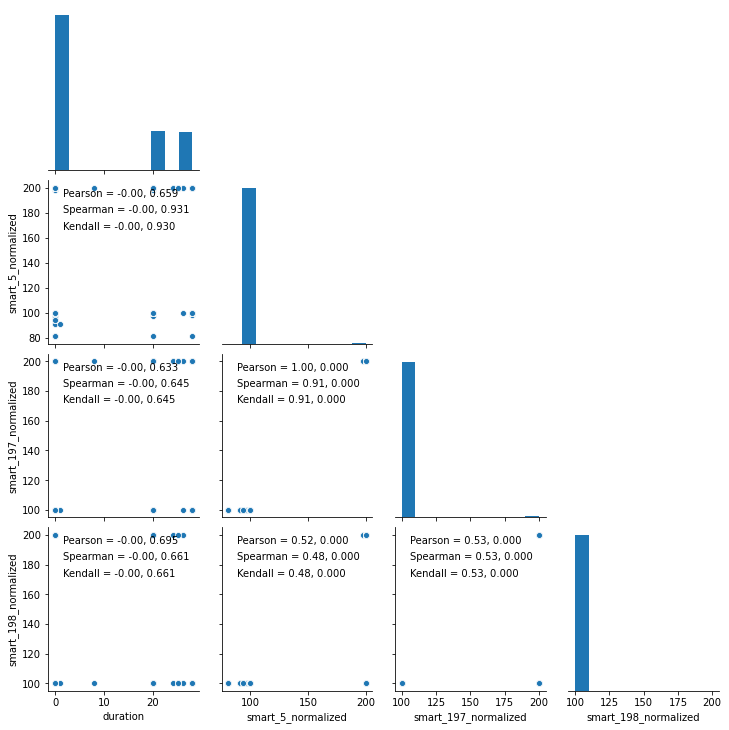

In [33]:
g = sns.pairplot(data=df2_ModelSubset.drop('failure', axis='columns'), corner=True)
g.map_lower(corrfunc)

# Survival regression using Cox Proportional Hazard

In [34]:
#ConvergenceError: Convergence halted due to matrix inversion problems. Suspicion is high collinearity.
#Such errors were encountered while trying different combinations of features and while trying to training different ML models by device model
cph = CoxPHFitter()
cph.fit(df2[['duration', 'failure','smart_5_normalized']],'duration','failure')
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 364122 total observations, 363887 right-censored observations>
             duration col = 'duration'
                event col = 'failure'
      baseline estimation = breslow
   number of observations = 364122
number of events observed = 235
   partial log-likelihood = -2768.13
         time fit was run = 2021-01-06 06:19:24 UTC

---
                     coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                  
smart_5_normalized   0.01       1.01       0.00             0.00             0.01                 1.00                 1.01

                      z      p   -log2(p)
covariate                                
smart_5_normalized 3.05 <0.005       8.78
---
Concordance = 0.48
Partial AIC = 5538.26
log-likelihood ratio test = 7.61 on 1 df
-log2(p) of ll-ratio test = 7.42